In [1]:
import pandas as pd
import sqlite3

conn = sqlite3.connect('data/test1/cua-db.db')
query = "SELECT * FROM touch_input"

df = pd.read_sql_query(query, conn)
positions = df[['abs_mt_tracking_id', 'x_position', 'y_position', 'accelerometer_x', 'accelerometer_y', 'accelerometer_z', 'timestamp']]
positions = positions.replace(-1, pd.NaT)
positions = positions.dropna()

print(positions.dtypes)
positions.describe()

abs_mt_tracking_id      int64
x_position            float64
y_position            float64
accelerometer_x       float64
accelerometer_y       float64
accelerometer_z       float64
timestamp               int64
dtype: object


,abs_mt_tracking_id,x_position,y_position,accelerometer_x,accelerometer_y,accelerometer_z,timestamp
count,72516.000000,72516.000000,72516.000000,72516.000000,72516.000000,72516.000000,7.251600e+04
mean,27422.422017,755.900312,1652.749531,-1.164113,9.607433,-0.262125,1.582983e+12
std,221.597008,201.098601,318.725672,1.195655,0.541441,1.705510,2.683456e+05
min,27041.000000,0.000000,9.000000,-3.261193,2.628768,-5.075847,1.582982e+12
25%,27239.000000,744.000000,1504.750000,-2.181455,9.487861,-1.630739,1.582983e+12
50%,27411.000000,817.000000,1725.000000,-1.513501,9.653054,-0.653947,1.582983e+12
75%,27605.000000,867.000000,1861.000000,-0.158441,9.803882,1.069805,1.582983e+12
max,27837.000000,1058.000000,2327.000000,1.799931,10.660969,9.669407,1.582983e+12


In [6]:
def _getDataFrameFromPath(path):
    conn = sqlite3.connect(path)
    query = "SELECT * FROM touch_input"

    df = pd.read_sql_query(query, conn)
    df = df[['abs_mt_tracking_id', 'x_position', 'y_position', 'accelerometer_x', 'accelerometer_y', 'accelerometer_z', 'timestamp']]
    df = df.replace(-1, pd.NaT)
    df = df.dropna()
    df = df.drop_duplicates(subset=['x_position', 'y_position'])

    return df

## Visualize the loaded touch input patterns

Here we are going to visualize a single touch input. Duplicated entries in the DataFrame are dropped and the plot is resized to represent the scale of the OnePlus6T phone screen (1080x2340 pixels as per https://www.gsmarena.com/oneplus_6t-9350.php)

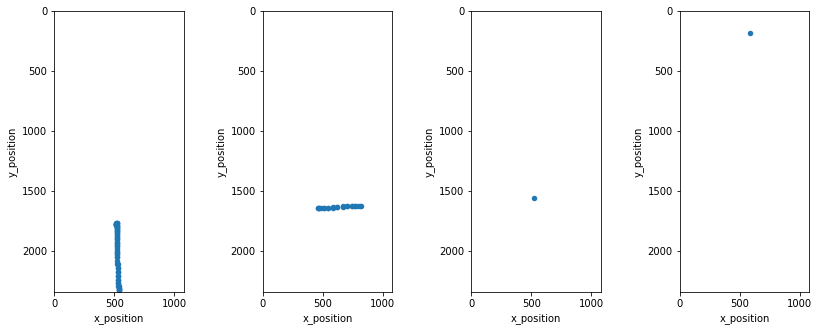

In [3]:
import matplotlib.pyplot as plt

# Get rid of duplicate entries
positions = positions.drop_duplicates(subset=['x_position', 'y_position'])
tracking_id_min = positions['abs_mt_tracking_id'].min()

# Get the values of the touch input with trackingId tracking_id_min - (tracking_id_min + 4)
strokes = []
for i in range(0, 4):
    stroke = positions[positions['abs_mt_tracking_id'] == (tracking_id_min + i)]
    strokes.append(stroke)

fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(12, 12))

for i, stroke in enumerate(strokes, start = 0):
    ax = stroke.plot.scatter(x = 'x_position', y = 'y_position', ax = axes[i])
    ax.axis('scaled') # Keeping the aspect ratio correct
    ax.set_xlim([0, 1080])
    ax.set_ylim([0, 2340])
    ax.invert_yaxis()


fig.tight_layout(pad=3.0)

## Visualize the whole distribution of each dataset

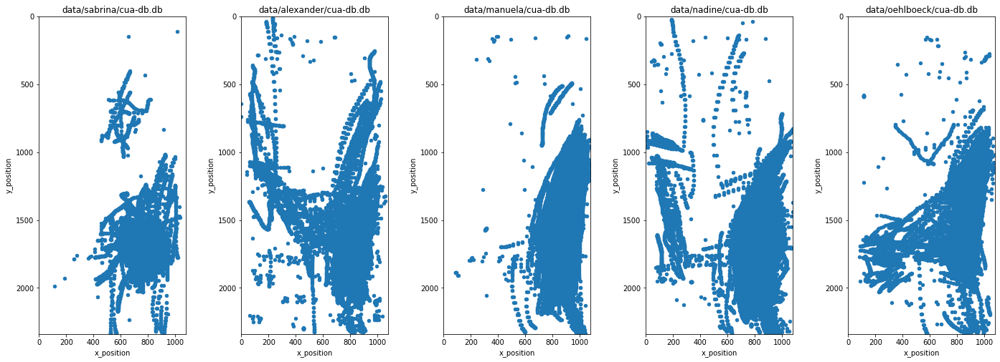

In [7]:
from pomegranate import MultivariateGaussianDistribution

datasets = ['data/test1/cua-db.db', 'data/test2/cua-db.db', 'data/test3/cua-db.db', 'data/test4/cua-db.db', 'data/test5/cua-db.db']
fig, axes = plt.subplots(nrows=1, ncols=len(datasets), figsize=(20, 10))

for i in range(0, len(datasets)):
    df = _getDataFrameFromPath(datasets[i])
    strokes_xy = df[['x_position', 'y_position']]
    ax = strokes_xy.plot.scatter(x = 'x_position', y = 'y_position', title = datasets[i], ax = axes[i])
    ax.axis('scaled') # Keeping the aspect ratio correct
    ax.set_xlim([0, 1080])
    ax.set_ylim([0, 2340])
    ax.invert_yaxis()

fig.tight_layout(pad=3.0)

## Data points per stroke
Next we want to know how many data points each of the strokes in the dataset contains, because as you can see some strokes are longer and some are shorter but if we want to feed a HMM with the strokes the sequences have to be of equal length (Choosing bin size for histogram: https://www.statisticshowto.datasciencecentral.com/choose-bin-sizes-statistics/)

Min tracking number: 27041
Max tracking number: 27837
Number of strokes in dataset: 796
Mean of the number of positions per stroke: 35.595477386934675
Median of the number of positions per stroke: 17.0
Count bins: 28


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000289D4F9EB88>]],
      dtype=object)

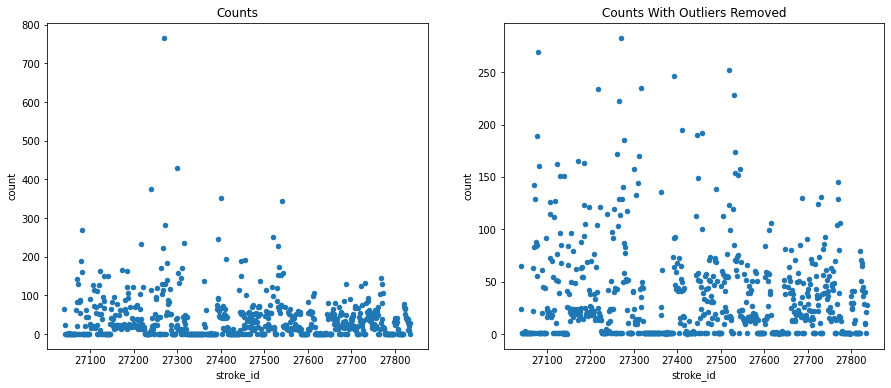

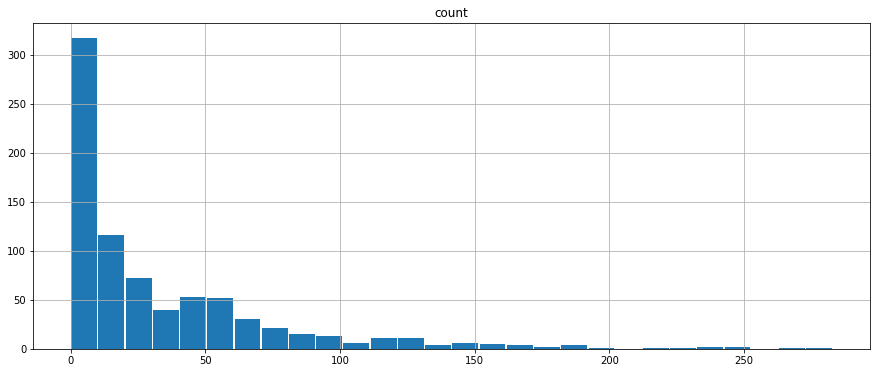

In [8]:
strokes = positions
tracking_id_min = strokes['abs_mt_tracking_id'].min()
tracking_id_max = strokes['abs_mt_tracking_id'].max()

print(f'Min tracking number: {tracking_id_min}')
print(f'Max tracking number: {tracking_id_max}')
print(f'Number of strokes in dataset: {tracking_id_max - tracking_id_min}')

pos_count = []

for tracking_id in range(tracking_id_min, tracking_id_max):
    idx = strokes.index[strokes['abs_mt_tracking_id'] == tracking_id].tolist()
    pos_count.append([tracking_id, len(idx)])

positions_per_stroke = pd.DataFrame(pos_count, columns = ['stroke_id', 'count'])
mean = positions_per_stroke['count'].mean()
median = positions_per_stroke['count'].median()

print(f'Mean of the number of positions per stroke: {mean}')
print(f'Median of the number of positions per stroke: {median}')

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

positions_per_stroke_no_outliers = positions_per_stroke[positions_per_stroke['count'] <= 300]
positions_per_stroke.plot.scatter(x = 'stroke_id', y = 'count', title = 'Counts', ax = axes[0])
positions_per_stroke_no_outliers.plot.scatter(x = 'stroke_id', y = 'count', title = 'Counts With Outliers Removed', ax = axes[1])
count_bins = int(positions_per_stroke_no_outliers['count'].max() / 10)
print(f'Count bins: {count_bins}')
positions_per_stroke_no_outliers.hist(bins = count_bins, column = 'count', rwidth = 0.95, figsize=(15, 6))


### Printing the dataset values (x_position, y_position, accelerometer_x, accelerometer_y, accelerometer_z) as a histogram to see if we have some kind of distribution

Histogram of dataset values for 1 stroke, 10 strokes and all strokes of data


array([<matplotlib.axes._subplots.AxesSubplot object at 0x00000289CFC27E88>],
      dtype=object)

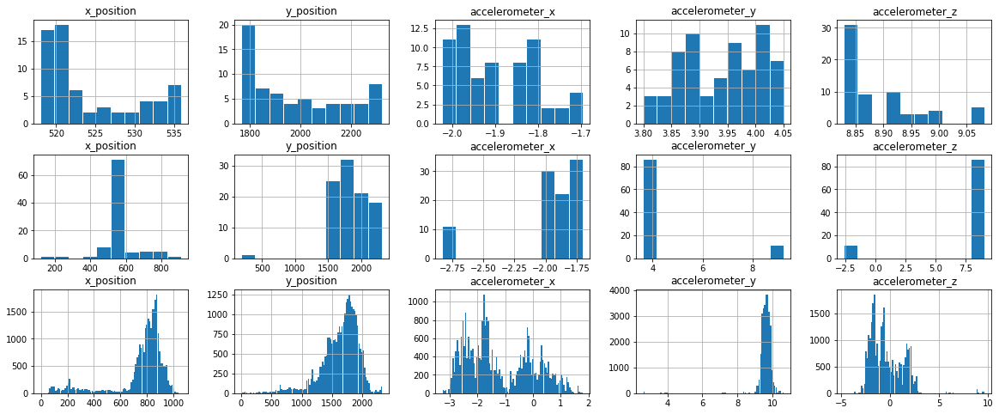

In [9]:
strokes = positions
tracking_id = strokes['abs_mt_tracking_id'].min()

stroke = strokes.loc[strokes['abs_mt_tracking_id'] == tracking_id]

strokes_10 = strokes.loc[strokes['abs_mt_tracking_id'] < (tracking_id + 10)]

fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(20, 8))

stroke.hist(bins = 10, column = 'x_position', rwidth = 0.95, ax = axes[0, 0])
stroke.hist(bins = 10, column = 'y_position', rwidth = 0.95, ax = axes[0, 1])
stroke.hist(bins = 10, column = 'accelerometer_x', rwidth = 0.95, ax = axes[0, 2])
stroke.hist(bins = 10, column = 'accelerometer_y', rwidth = 0.95, ax = axes[0, 3])
stroke.hist(bins = 10, column = 'accelerometer_z', rwidth = 0.95, ax = axes[0, 4])

strokes_10.hist(bins = 10, column = 'x_position', rwidth = 0.95, ax = axes[1, 0])
strokes_10.hist(bins = 10, column = 'y_position', rwidth = 0.95, ax = axes[1, 1])
strokes_10.hist(bins = 10, column = 'accelerometer_x', rwidth = 0.95, ax = axes[1, 2])
strokes_10.hist(bins = 10, column = 'accelerometer_y', rwidth = 0.95, ax = axes[1, 3])
strokes_10.hist(bins = 10, column = 'accelerometer_z', rwidth = 0.95, ax = axes[1, 4])

print(f'Histogram of dataset values for 1 stroke, 10 strokes and all strokes of data')
strokes.hist(bins = 100, column = 'x_position', rwidth = 0.95, ax = axes[2, 0])
strokes.hist(bins = 100, column = 'y_position', rwidth = 0.95, ax = axes[2, 1])
strokes.hist(bins = 100, column = 'accelerometer_x', rwidth = 0.95, ax = axes[2, 2])
strokes.hist(bins = 100, column = 'accelerometer_y', rwidth = 0.95, ax = axes[2, 3])
strokes.hist(bins = 100, column = 'accelerometer_z', rwidth = 0.95, ax = axes[2, 4])